In [10]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt

In [11]:
%matplotlib inline

In [12]:
#177.6

In [13]:
data, rate = librosa.load("drilling.wav")

In [14]:
print(len(data))
ww = set(data)
no_of_labels = len(ww)

3920280


In [16]:
#data_list = np.split(data, 2205)

In [17]:
final_data = []
for a in data_list:
    final_data.append(a.tolist())

In [18]:
print(final_data[:10][:-3])

[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

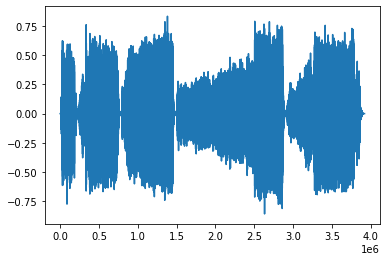

In [19]:
plt.plot(data)
plt.show()

ipd.Audio(data, rate = 22050)

In [20]:
from scipy.fft import rfft, ifft, rfftfreq

In [21]:
SAMPLE_RATE = 44100
DURATION = 10
print(len(data))

3920280


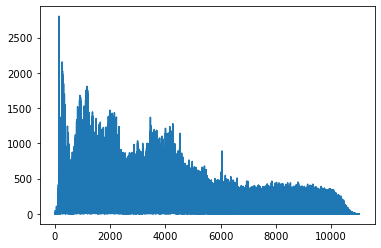

In [22]:
N = rate * DURATION
yf = rfft(data)
xf = rfftfreq(len(data), 1 / rate)

plt.plot(xf, np.abs(yf))
plt.show()

In [23]:
len(np.abs(yf))

1960141

In [24]:
print(np.abs(yf))

[41.09104     6.0240946   0.7319807  ...  0.11627923  0.16228415
  0.17165184]


In [25]:
from scipy import signal

In [26]:
fs = 10e3
f, t, Zxx = signal.stft(data, fs, nperseg=256)

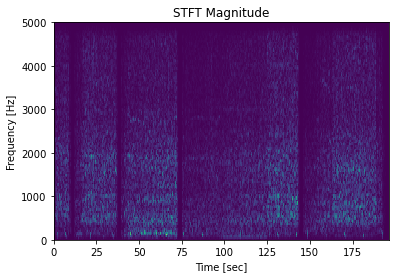

In [27]:
#%matplotlib notebook
plt.pcolormesh(t/2, f, np.abs(Zxx), vmin=0, shading='flat')
plt.title('STFT Magnitude')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

In [18]:
print(len(f))

129


In [19]:
print(1e6)

1000000.0


In [20]:
import tensorflow as tf

from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np 

In [21]:
fd = np.asarray(final_data)
xs = fd[:,:-1]
labels = fd[:,-1]

#
#validation_x = np.asarray(validation_x)

ys = tf.keras.utils.to_categorical(labels, num_classes=no_of_labels)

In [22]:
len(fd[:,-1])
len(xs)

2205

In [23]:
len(labels)

2205

In [27]:
ys[220].shape

(213942,)

In [39]:
ys[0]

array([1., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [ ]:
#xs = xs.reshape(1, *xs.shape)
#labels = labels.reshape(*labels.shape, 1)

In [28]:
xs[0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [29]:
xs[0].shape

(99,)

In [49]:
# model = Sequential()
# #model.add(Embedding(no_of_labels, 64, input_length=9))
# model.add(Bidirectional(LSTM(20)))
# model.add(Dense(1, activation='softmax'))
# model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(99,)),
    #tf.keras.layers.Embedding(tokenizer.vocab_size, 64),
    #tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64), input_shape=(3, 1)),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(213942, activation='softmax')
])

In [50]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 256)               25600     
_________________________________________________________________
dense_11 (Dense)             (None, 213942)            54983094  
Total params: 55,008,694
Trainable params: 55,008,694
Non-trainable params: 0
_________________________________________________________________


In [28]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

NameError: name 'model' is not defined

In [52]:
history = model.fit(xs, ys, epochs=10, verbose=1)

Epoch 1/10
69/69 [==============================] - 23s 329ms/step - loss: 11.9396 - accuracy: 0.8967
Epoch 2/10
69/69 [==============================] - 24s 350ms/step - loss: 7.2755 - accuracy: 1.0000
Epoch 3/10
69/69 [==============================] - 22s 323ms/step - loss: 0.1271 - accuracy: 1.0000
Epoch 4/10
69/69 [==============================] - 25s 365ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 5/10
69/69 [==============================] - 26s 382ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 6/10
69/69 [==============================] - 24s 352ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 7/10
69/69 [==============================] - 24s 348ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 8/10
69/69 [==============================] - 24s 350ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 9/10
69/69 [==============================] - 23s 339ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 10/10
69/69 [==============================] - 23s 330ms/step - loss: 0.0025 - accur